## Preprocessing

In [1]:
import json
import numpy as np
import pandas as pd
import gensim
import networkx as nx
import collections

import nltk
from nltk import FreqDist
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
import re 
from collections import Counter
from num2words import num2words
from pprint import pprint
from gensim.models import CoherenceModel
from scipy.linalg import svd
from sklearn.decomposition import TruncatedSVD

from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# for Mac
%matplotlib inline
%config InlineBackend.figure_format='retina'

In /home/martin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/martin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/martin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/martin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/martin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/s

### Open dict

In [3]:
parsed_sites = 'abs_dict_pubag.json'

print("Started Reading JSON file")
with open(parsed_sites, "r") as read_file:
    abstract_dict = json.load(read_file)
    print("Decoded JSON Data From File")

Started Reading JSON file
Decoded JSON Data From File


In [4]:
abstract_df = pd.DataFrame.from_dict(abstract_dict)
abstract_df.head()

,titles,abstracts,authors,keywords,sources,dates
0,Examining the social and biophysical determina...,Precision agricultural technologies (PA) such ...,"[Gardezi, Maaz, Bronson, Kelly]","[corn, farmers, financial economics, food prod...",Precision agriculture,2020
1,Wireless Sensor Network Synchronization for Pr...,The advent of Internet of Things has propelled...,"[Zervopoulos, Alexandros, Tsipis, Athanasios, ...","[Olea europaea, decision making, environmental...",Agriculture (Basel),2020
2,Smartphone Applications Targeting Precision Ag...,Traditionally farmers have used their perceptu...,"[Mendes, Jorge, Pinho, Tatiana M., Neves dos ...","[cost effectiveness, crops, farmers, humans, m...",Agronomy,2020
3,Controlled release micronutrient fertilizers f...,The rapid growth of the global population and ...,"[Mikula, Katarzyna, Izydorczyk, Grzegorz, Skrz...","[coatings, farmers, food safety, groundwater, ...",The Science of the total environment,2020
4,Farm adoption of embodied knowledge and inform...,On-farm adoption of individual and groups of p...,"[Miller, N. J., Griffin, T. W., Ciampitti, I. ...","[farms, precision agriculture, probability, Ka...",Precision agriculture,2019


In [5]:
keywords = abstract_df['keywords'].map(lambda x : x if isinstance(x, list) else [x]).explode().unique().tolist()

### Build 3 corpus : ML, agriculture, mix

In [6]:
abstracts = abstract_dict['abstracts']
mix = []
for i in range (len(abstract_dict["abstracts"])):
    mix.append(abstract_dict["abstracts"][i])
        
print("We currently have {} abstracts in our mix dataset".format(len(mix)))

We currently have 83799 abstracts in our mix dataset


### Preprocess abtracts

In [14]:
# Useful functions

def convert_lower_case(data):
    return np.char.lower(data)

def remove_punctuation(data):
    symbols = "!\"#$%&()*+-.•/:;<=>?@[\]^_`{|}~\n"
    for i in range(len(symbols)):
        data = np.char.replace(data, symbols[i], ' ')
        data = np.char.replace(data, "  ", " ")
    data = np.char.replace(data, ',', '')
    return data

def remove_apostrophe(data):
    return np.char.replace(data, "'", "")

def stemming(data):
    stemmer= PorterStemmer()
    tokens = word_tokenize(str(data))
    new_text = ""
    for w in tokens:
        new_text = new_text + " " + stemmer.stem(w)
    return new_text

def lemming(data):
    lemmatizer = WordNetLemmatizer() 
    tokens = word_tokenize(str(data))
    new_text = ""
    for w in tokens:
        new_text = new_text + " " + lemmatizer.lemmatize(w)
    return new_text

def convert_numbers(data):
    tokens = word_tokenize(str(data))
    new_text = ""
    for w in tokens:
        try:
            w = num2words(int(w))
        except:
            a = 0
        new_text = new_text + " " + w
    new_text = np.char.replace(new_text, "-", " ")
    return new_text

def remove_stop_words(data,language, custom=[]):
    """
    Removing stop words from text. Its possible to add custom stop words  
    """
    stop_words = stopwords.words(language)
    if language == "english":
        stop_words = np.concatenate((stop_words, custom), axis = 0)
        
    words = word_tokenize(str(data))
    new_text = ""
    for w in words:
        if w not in stop_words and len(w) > 1:
            new_text = new_text + " " + w
    return new_text
    
def check_english(data):
    """
    Removing non english abstracts
    """   
    if "dengan" in data:
        return False
    elif "para" in data:
        return False
    for word in data:
        if bool(re.search('[а-яА-Я]', word)):
            return False
    return True

def preprocess(data, custom_stopwords):
    data = convert_lower_case(data)
    data = remove_punctuation(data)
    data = remove_apostrophe(data)
    data = convert_numbers(data)
    data = stemming(data)
    data = lemming(data)
    data = remove_stop_words(data,'english', custom_stopwords)
    data = remove_stop_words(data,'french')
    return data

# Preprocessing
def preprocess_corpus(corpus,tokenize=True, custom_stopwords=[]):
    preprocess_abstract = []
    for i, abstract in enumerate(corpus):
        preprocess_abs = str(preprocess(abstract, custom_stopwords))
        if check_english(preprocess_abs): # remove indian abstracts
            if tokenize: preprocess_abstract.append(word_tokenize(preprocess_abs))
            else: preprocess_abstract.append(preprocess_abs)
    return preprocess_abstract

<>:7: DeprecationWarning: invalid escape sequence \]
<>:7: DeprecationWarning: invalid escape sequence \]
<>:7: DeprecationWarning: invalid escape sequence \]
<ipython-input-14-e5875a8a0064>:7: DeprecationWarning: invalid escape sequence \]
  symbols = "!\"#$%&()*+-.•/:;<=>?@[\]^_`{|}~\n"


### Make bigrams

In [16]:
"""
# Build the bigram and trigram models
# Careful: it might be worth creating th bigrams etc before dtemming and lemming
bigram = gensim.models.Phrases(preprocess_abstract) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[preprocess_abstract], threshold=100)  


# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)
"""

def make_bigrams(preprocess_abstract,full_string=False):
    data_processed = []
    bigram = gensim.models.Phrases(preprocess_abstract)
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    for abstract in preprocess_abstract:
        data_processed.append(bigram_mod[abstract])
        
    if full_string:
        for i in range (len(data_processed)):
            inter = ""
            for j in range (len(data_processed[i])):
                inter+=" " + data_processed[i][j]
            data_processed[i]=inter
        
    return data_processed

### Main preprocess

In [61]:
custom_stopwords = ["ha","one", "two", "three", "four", "five", "six", "seven", "eight", "nine", "hundred", "thousand"]

In [15]:
%%time
preprocess_abstract = preprocess_corpus(mix, tokenize=True)
bigrams = make_bigrams(preprocess_abstract)

NameError: name 'make_bigrams' is not defined

## TF-IDF on Mix Corpus

In [18]:
%%time
# calling the TfidfVectorizer
vectorizer = TfidfVectorizer(analyzer=lambda x: x)
matrix = vectorizer.fit_transform(bigrams)
"""
tf idf matrix: 
  (0, 10160)	0.20382796012020193
  (0, 579)	0.12004197878002067
  (1, 11550)	0.06067951410030962
  (1, 10580)	0.04921149284960012
  ...
  (2068, 6279)	0.0405875184231818
  (2068, 1410)	0.026969943922128824
"""
feature_names = vectorizer.get_feature_names()  # list of all words present in abstracts


CPU times: user 5.27 s, sys: 284 ms, total: 5.55 s
Wall time: 5.57 s


### TF-IDF sum scores

In [64]:
def tf_idf(bigrams, plot = True):
    # here we are calculating the tf idf score (fitting it specifically in each bstract)
    # and then summing the tf-idf scores on all the texts

    words = {}
    for i in range (len(bigrams)):
        response = vectorizer.transform([bigrams[i]])
        feature_names = vectorizer.get_feature_names()

        for col in response.nonzero()[1]:
            if feature_names[col] not in words.keys():
                words[feature_names[col]] = response[0, col]
            else:
                words[feature_names[col]] += response[0, col]

    # Retrieving the words with highest sum of tf idf scores (not very pertinent)
    # the mean is maybe more interesting (see next function)
    nbr_words = 50
    
    words_copy = words.copy()
    """
    words_copy.pop("use")
    words_copy.pop("two")
    words_copy.pop("one")
    words_copy.pop("data")
    """


    max_words = []

    for i in range (nbr_words):
        maximum = max(words_copy, key=words_copy.get)  
        max_words.append(maximum)
        words_copy.pop(maximum) 
    sum_score = [words[word] for word in max_words]
    if plot:
        f, ax = plt.subplots(1,1,figsize=(15,7))
        ax.set_title("TF-IDF Highest Sum Scores",fontsize=20)
        ax.bar(max_words,sum_score)
        plt.xticks(rotation=75)
        plt.show()
    else:
        return sum_score, max_words

In [7]:
tf_idf(bigrams)

NameError: name 'tf_idf' is not defined

### TF-IDF highest scores

In [10]:
def top_tfidf_feats(row, features, top_n=25):
    ''' Get top n tfidf values in row and return them with their corresponding feature names.'''
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'tfidf']
    return df

def top_feats_in_doc(Xtr, features, row_id, top_n=25):
    ''' Top tfidf features in specific document (matrix row) '''
    row = np.squeeze(Xtr[row_id].toarray())
    return top_tfidf_feats(row, features, top_n)

def top_mean_feats(Xtr, features, grp_ids=None, min_tfidf=0.1, top_n=25):
    ''' Return the top n features that on average are most important (have highest tf-idf score)
        amongst documents in rows indentified by indices in grp_ids. '''
    if grp_ids:
        D = Xtr[grp_ids].toarray()
    else:
        D = Xtr.toarray()

    D[D < min_tfidf] = 0
    tfidf_means = np.mean(D, axis=0)
    return top_tfidf_feats(tfidf_means, features, top_n)

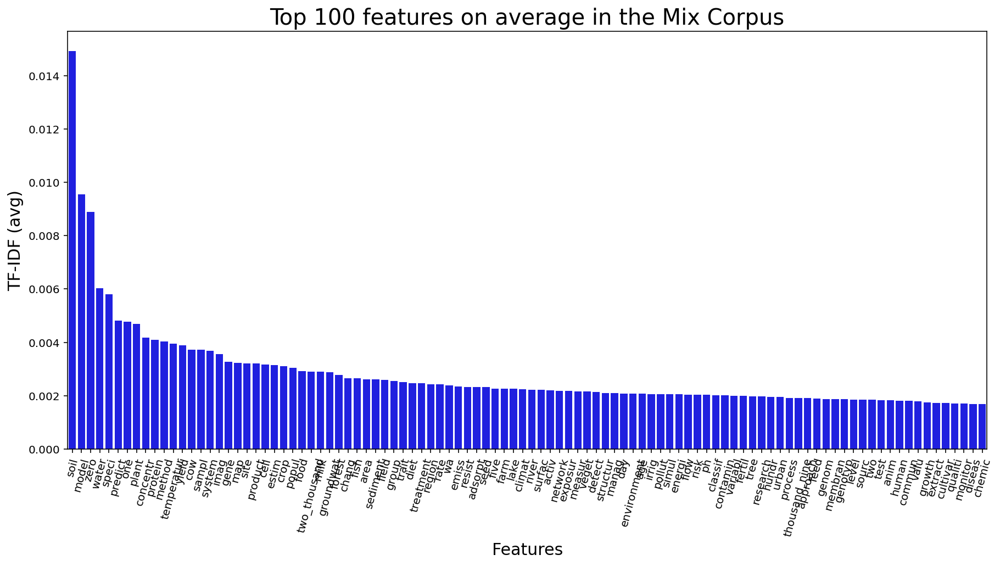

In [11]:
top_words = top_mean_feats(matrix,feature_names,top_n=100)

f, ax = plt.subplots(1,1,figsize=(15,7))
sns.barplot(data=top_words, x="feature", y="tfidf", color="blue",ax=ax)
ax.set_title("Top {} features on average in the Mix Corpus".format(len(top_words.feature)),fontsize=20)
ax.set_xlabel("Features",fontsize=15)
ax.set_ylabel("TF-IDF (avg)",fontsize=15)
plt.xticks(rotation=75)
plt.show()

## Co-occurences

### Class definition

In [12]:
class CooccEmbedding:
    def __init__(self, corpus):
        """
        Takes in the corpus in the form of a list of lists (list of abstracts, 
        each abstract being a list of tokens)
        """
        self.corpus = corpus
       
    
    def vocabulary(self):
        """
        Returns the vocabulary associated with the corpus (a list of unique tokens from the corpus)
        """
        self.vocab = []
        [self.vocab.append(word) for sent in self.corpus for word in sent if word not in self.vocab]
        self.len_vocab = len(self.vocab)
        return self.vocab

    def set_vocab(self,new_vocab):
        """
        Modify vocabulary manually
        """
        self.vocab = new_vocab
        self.len_vocab = len(self.vocab)
        return self.vocab
        
    def cooc_matrix(self):
        """
        Returns the co-occurrence matrix associated with the corpus.
        We first calculate the occurences of each word in each abstract
        """
        count_vectorizer = CountVectorizer(analyzer=lambda x: x,vocabulary=self.vocab)
        
        Xc = count_vectorizer.fit_transform(self.corpus)

        Xc = (Xc.T * Xc)
        Xc.setdiag(0)
        self.coocc_mat = Xc.todense()
        
        return self.coocc_mat

    def cooc_dict(self):
        """
        Returns the dictionnary with the co-occurrence matrix score associated to each pair of words.
        """        
        dict_voc = {}
        for i in range(len(self.vocab)):
            for j in range (i+1, len(self.vocab)):
                co = self.vocab[i] +" "+ self.vocab[j]
                dict_voc[co]=self.coocc_mat[i,j]
        return dict_voc

    def dict_pair(self,indexes):
        """
        Returns the dictionnary with the co-occurrence matrix score associated to each pair of words.
        Take a list of indexes as argument
        """  
        dict_voc = {}
        for row,col in indexes:
            pair = self.vocab[col] + ' ' + self.vocab[row]
            dict_voc[pair] = self.coocc_mat[col,row]
        dict_voc = dict(sorted(dict_voc.items(), key=lambda item: item[1],reverse=True))
        return dict_voc
        
    def svd_reduction(self, n_components = 2, n_iter = 10):
        """
        Performs a singular value decomposition on the co-occurrence matrix M and returns the truncated
        matrix U, where M = UDV^T.
        """
        svd = TruncatedSVD(n_components = n_components, n_iter = n_iter)
        self.reduced_matrix = svd.fit_transform(self.coocc_mat)
        return self.reduced_matrix
    
    def vocab_ind_to_plot(self, vocab_to_plot):
        """
        Takes in the a list of vocabulary to plot and returns a dictionary in the form of
        {word:index} which is a subset of the vocabulary.
        """
        vocab_dict = dict(zip(self.vocab, range(self.len_vocab)))
        self.dic_vocab_to_plot = {key:value for key, value in vocab_dict.items() if key in vocab_to_plot}
        return self.dic_vocab_to_plot

In [13]:
def plot_network_cooc(d, word_to_topic=None,figsize=(50, 30)):
    """
    ARGS: d: dictionnary of pairs of cooccurrences
        topic words is a non compulsory dictionnary we can add feed the function. It comes as
        {word1: 1, word2: 2, ..., word10: 3, ...}. Every word is associated to a topic
        word 5 and 6 represent the topic 2 and so on.
    Plot the network. The nodes will have different colors depending on the topic they are associated to
    if topic_words is not None
    
    """
    # Create network plot 
    G = nx.Graph()
    fig, ax = plt.subplots(figsize=figsize)

    # Create connections between nodes
    for k, v in d.items():
        k=k.split(" ")
        G.add_edge(k[0], k[1], weight=v)
    edges = G.edges()
    weights = [G[u][v]['weight'] for u,v in edges]
    max_weights = max(weights)
    min_weights = min(weights)
    weights = 13*(weights-min_weights+1)/(max_weights-min_weights)
    
    pos = nx.spring_layout(G, k=2)

    # Plot networks
    nx.draw_networkx(G, pos,
                     font_size=16,
                     edge_color='grey',
                     node_color='purple',
                     with_labels = False,
                     width=weights,
                     ax=ax)

    # Create offset labels
    for key, value in pos.items():
        x, y = value[0], value[1]+.015
        if word_to_topic==None:
            ax.text(x, y,s=key,
                    bbox=dict(facecolor='red', alpha=0.25),
                    horizontalalignment='center', fontsize=13)
        else:
            color_dict = {0: "black", 1: "lightcoral", 2: "red", 3:"darkorange", 4: "gold", 5:"chartreuse", 6:"aqua", 7:"deepskyblue", 8:"darkblue", 9:"deeppink"}
            topic_nbr = word_to_topic[key]
            ax.text(x, y,s=key,
                    bbox=dict(facecolor=color_dict[topic_nbr], alpha=0.25),
                    horizontalalignment='center', fontsize=13)
            
    
    plt.show()
                          

In [14]:
def n_highest_indices(a, n):
    """
    Find the indexes corresponding to the n highest values in the array
    """
    m = a.shape[0]
    r = np.arange(m)
    mask = r[:,None] > r
    idx = a[mask].argpartition(-n)[-n:]
    
    clens = np.arange(m).cumsum()    
    grp_start = clens[:-1]
    grp_stop = clens[1:]-1    

    rows = np.searchsorted(grp_stop, idx)+1    
    cols  = idx - grp_start[rows-1]
    return np.array(list(zip(rows[0,-n:], np.array(cols)[0,-n:])))

### Co-occurence on smaller vocabulary

Create an instance for the CooccEmbedding class

In [15]:
inst = CooccEmbedding(bigrams)

Generate the vocabulary associated with the corpus

In [ ]:
%%time
vocab_inst = inst.vocabulary()

We can also set the vocabulary **manually**

In [16]:
new_vocab_inst = inst.set_vocab(top_words.feature)

Calculate the co-occurrence matrix

In [17]:
%%time
cooc_matrix = inst.cooc_matrix()

CPU times: user 2.55 s, sys: 544 ms, total: 3.09 s
Wall time: 3.12 s


In [18]:
cooc_matrix

matrix([[    0, 36013, 40589, ...,  4351,   355,  4357],
        [36013,     0, 59566, ...,  8003,  4091,  5419],
        [40589, 59566,     0, ...,  7125,  4509,  3692],
        ...,
        [ 4351,  8003,  7125, ...,     0,   710,  1409],
        [  355,  4091,  4509, ...,   710,     0,   305],
        [ 4357,  5419,  3692, ...,  1409,   305,     0]])

Find **highest co-occurences** and plot a **network**

In [19]:
indexes = n_highest_indices(cooc_matrix,300)
dict_highest_pair = inst.dict_pair(indexes)

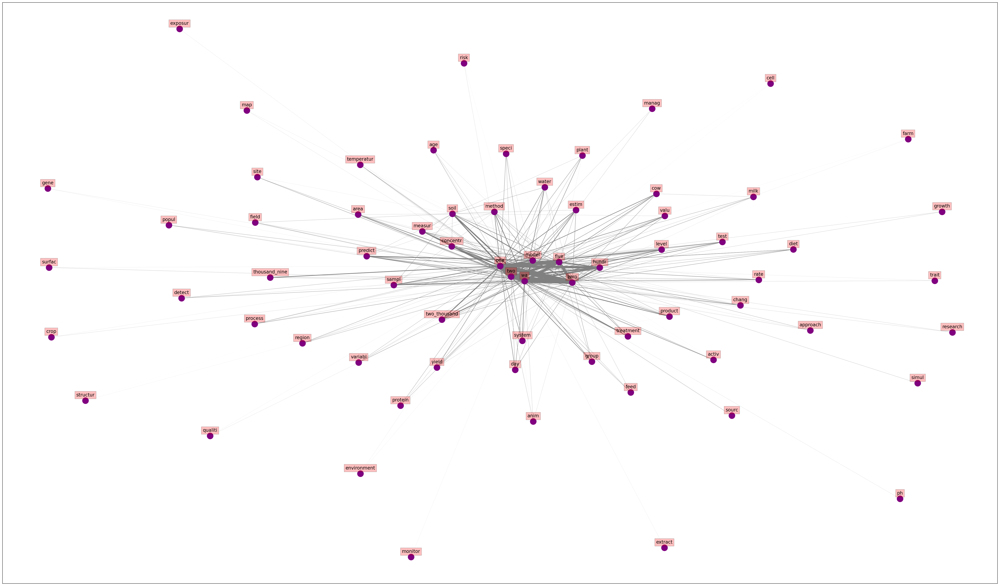

In [20]:
plot_network_cooc(dict_highest_pair)

### Co-occurence matrix on corpus

In [21]:
%%time
inst_bigrams = CooccEmbedding(bigrams)

CPU times: user 8 µs, sys: 1e+03 ns, total: 9 µs
Wall time: 12.9 µs


In [22]:
%%time
vocab_inst = inst_bigrams.vocabulary()

CPU times: user 58min 4s, sys: 19.9 s, total: 58min 24s
Wall time: 58min 48s


In [23]:
%%time
cooc_matrix_bigrams = inst_bigrams.cooc_matrix()

CPU times: user 21.4 s, sys: 26 s, total: 47.4 s
Wall time: 52.4 s


In [24]:
cooc_matrix_bigrams

matrix([[  0, 646, 216, ...,   0,   0,   0],
        [646,   0, 257, ...,   0,   0,   0],
        [216, 257,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   8,   1],
        [  0,   0,   0, ...,   8,   0,   8],
        [  0,   0,   0, ...,   1,   8,   0]])

Find **highest co-occurences** and plot a **network**

In [ ]:
%%time
indexes = n_highest_indices(cooc_matrix_bigrams,300)
dict_highest_pair = inst_bigrams.dict_pair(indexes)

In [ ]:
plot_network_cooc(dict_highest_pair)

### Without specific words

In [82]:
%%time
inst_modified = CooccEmbedding(bigrams)
vocab_modified = inst_modified.vocabulary()

CPU times: user 4.86 s, sys: 35.4 ms, total: 4.9 s
Wall time: 4.93 s


We remove some words that we don't judge paramount to the understanding of the corpus. For eg ***use***

In [83]:
vocab_modified = inst_modified.vocab.copy()
vocab_modified.remove('use')
vocab_modified.remove('among')
vocab_modified.remove('wa')
vocab_modified.remove('base')
vocab_modified = inst_modified.set_vocab(vocab_modified)

In [84]:
%%time
cooc_matrix_modified = inst_modified.cooc_matrix()

CPU times: user 356 ms, sys: 237 ms, total: 593 ms
Wall time: 597 ms


In [85]:
cooc_matrix_modified

matrix([[ 0, 26,  3, ...,  0,  0,  0],
        [26,  0, 58, ...,  1,  1,  0],
        [ 3, 58,  0, ...,  0,  0,  0],
        ...,
        [ 0,  1,  0, ...,  0,  1,  0],
        [ 0,  1,  0, ...,  1,  0,  0],
        [ 0,  0,  0, ...,  0,  0,  0]])

In [86]:
indexes = n_highest_indices(cooc_matrix_modified,100)
dict_highest_pair = inst_modified.dict_pair(indexes)

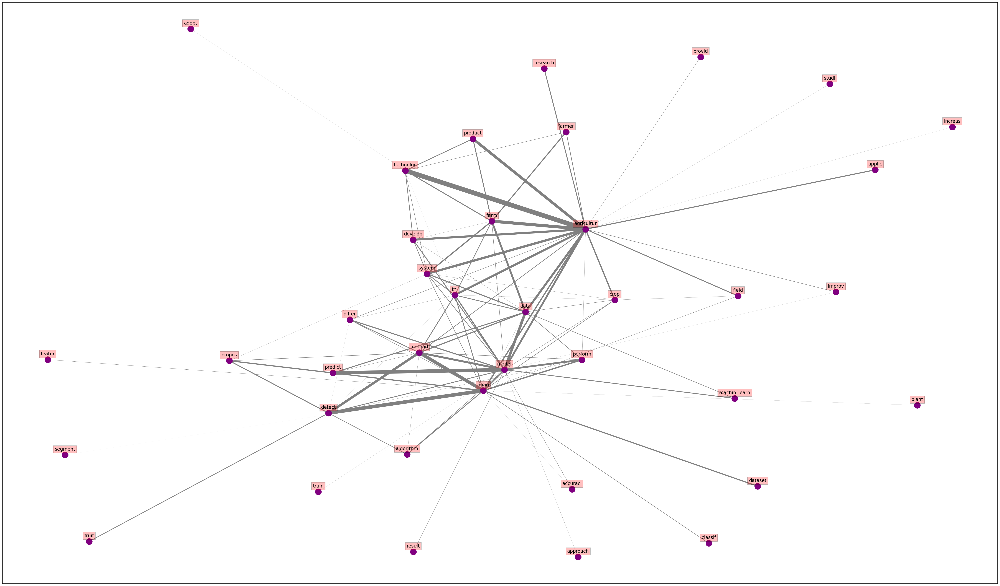

In [87]:
plot_network_cooc(dict_highest_pair)

In [89]:
indexes = n_highest_indices(cooc_matrix_modified,300)
dict_highest_pair = inst_modified.dict_pair(indexes)

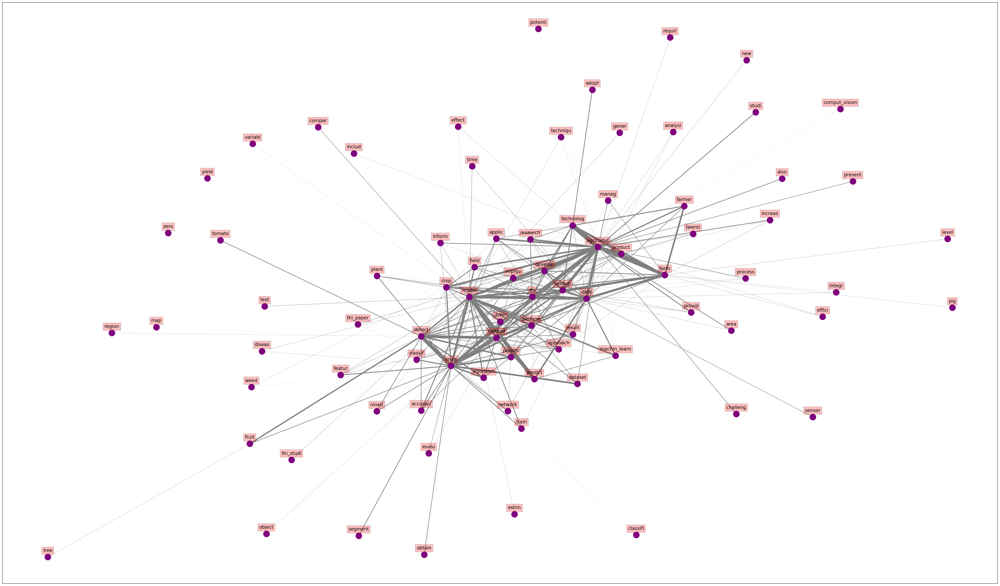

In [90]:
plot_network_cooc(dict_highest_pair)

## SVD applied to co occurence matrix

In [92]:
inst = CooccEmbedding(bigrams)
vocab_inst = inst.vocabulary()
# new_vocab_inst = inst.set_vocab(list(top_words.feature))
cooc_matrix = inst.cooc_matrix()
len(vocab_inst)

14673

Compute SVD matrix

In [93]:
%%time
svd_matrix = inst.svd_reduction()

CPU times: user 1min 18s, sys: 19.2 s, total: 1min 37s
Wall time: 1min 6s


Plot a specific sub-vocabulary

In [94]:
vocab_to_plot = list(top_words.feature)
voc_plot_ind = inst.vocab_ind_to_plot(vocab_to_plot)

In [136]:
svd_matrix = svd_matrix/10

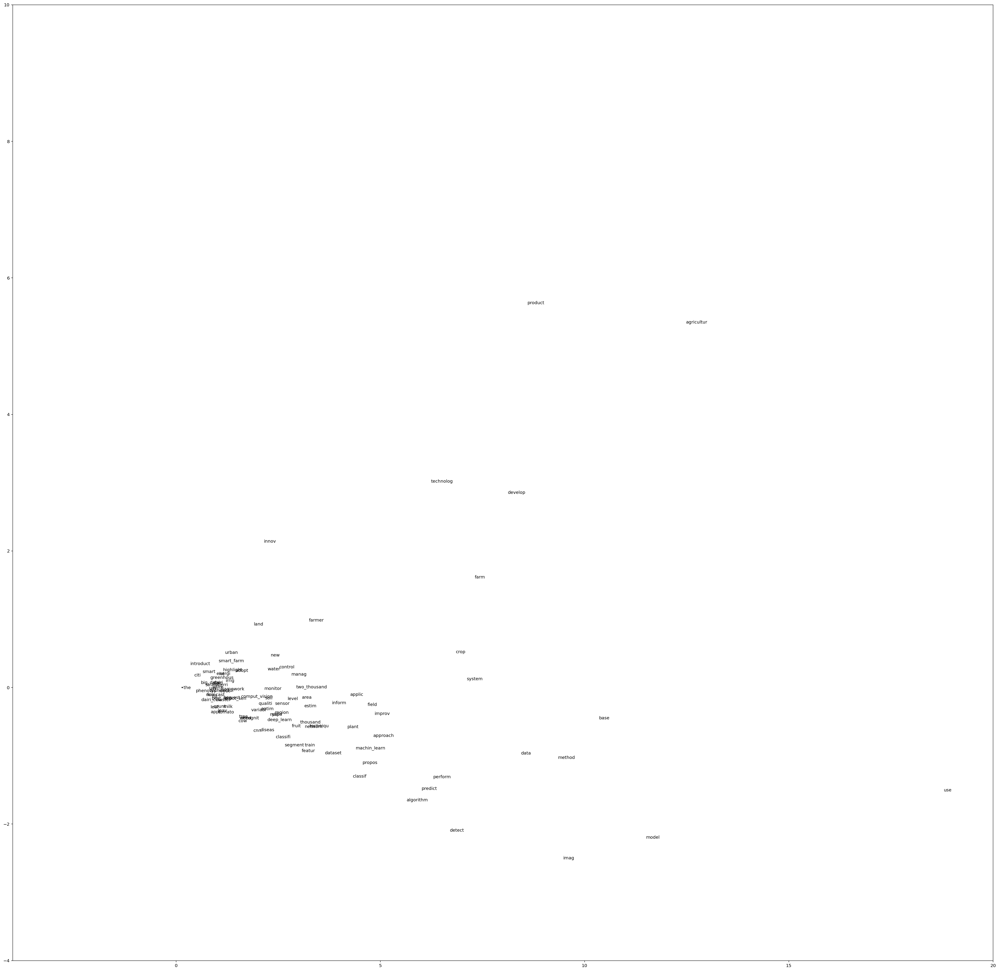

In [138]:
f = plt.figure(figsize=(40,40))
plt.xlim(-4, 20)
plt.ylim(-4, 10)
dict_to_plot = inst.vocab_ind_to_plot(vocab_to_plot)

for word, ind in dict_to_plot.items():
    plt.text(svd_matrix[ind, 0], svd_matrix[ind, 1], vocab_inst[ind])

## LDA - Topic Modeling

In [35]:
def remove_highest_freq(c, term_nbr):
    #removes terms of highest frequecies in the whole corpus
    #input: list of the form [["ajh", "ghkv"], [" "], ["poj", "poj", "ajh"]]
    #output: same list without the terms of highest frequencies
    a=[]
    for i in range (len(c)):
        a = np.concatenate((a,c[i]))
    counter=collections.Counter(a)
    indesirables = []
    for i in range (term_nbr):
        maximum = max(counter, key=counter.get)  # Just use 'min' instead of 'max' for minimum.
        indesirables.append(maximum)
        counter.pop(maximum)#print(maximum, mydict[maximum])
    for j in range(len(c)):    
        for elem in indesirables:
            c[j] = list(filter(lambda b: b != elem, c[j]))
    return c

def remove_lowest_freq(c):
    #removes terms of highest frequecies in the whole corpus
    #input: list of the form [["ajh", "ghkv"], [" "], ["poj", "poj", "ajh"]]
    #output: same list without the terms of highest frequencies
    a=[]
    indesirables=[]
    for i in range (len(c)):
        a = np.concatenate((a,c[i]))
    counter=collections.Counter(a)
    for key in counter.keys():
        if counter[key] == 1 or counter[key] == 2 or counter[key] == 3 or counter[key] == 4:
            indesirables.append(key)
    for j in range(len(c)):    
        for elem in indesirables:
            c[j] = list(filter(lambda b: b != elem, c[j]))
    return c

### Visualisation

In [36]:
def build_LDA(corpus,stopwords=[]):
    preprocess_abstract = preprocess_corpus(corpus, tokenize=True, custom_stopwords=stopwords)
    bigrams = make_bigrams(preprocess_abstract)
    """
    print(bigrams)
    for i in range (len(bigrams)):
        if bigrams[i][0]==" ":
            bigrams[i] = bigrams[i][1:]
        bigrams[i] = bigrams[i].split(" ")
    """
    # Create Dictionary
    id2word = gensim.corpora.Dictionary(bigrams)

    # Create Corpus
    texts = bigrams
    
    #remove p terms of highest frequency:
    #texts = remove_highest_freq(texts, term_nbr=100)

    # Term Document Frequency
    corpus = [id2word.doc2bow(text) for text in texts]

    

    # Build LDA model
    lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                               id2word=id2word,
                                               num_topics=10, 
                                               random_state=100,
                                               update_every=1,
                                               chunksize=100,
                                               passes=10,
                                               alpha='auto',
                                               per_word_topics=True)

    """
    # Print the Keyword in the 10 topics
    pprint(lda_model.print_topics())
    doc_lda = lda_model[corpus]
    """

    # Visualize the topics
    pyLDAvis.enable_notebook()
    vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    return vis, lda_model

In [91]:
viz, ldamodel = build_LDA(mix)
viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9      0.192365 -0.135663       1        1  26.757143
3      0.261449 -0.051808       2        1  23.215562
8      0.212963  0.181046       3        1  21.058402
4      0.163632 -0.212897       4        1  14.973593
2      0.109526  0.286251       5        1   9.207176
0     -0.109726 -0.087971       6        1   2.820144
1     -0.171488 -0.009507       7        1   0.832142
6     -0.222889  0.010346       8        1   0.473950
5     -0.221059  0.010699       9        1   0.350541
7     -0.214772  0.009504      10        1   0.311346, topic_info=            Term         Freq        Total Category  logprob  loglift
193           wa  1978.000000  1978.000000  Default  30.0000  30.0000
605         farm  1615.000000  1615.000000  Default  29.0000  29.0000
108       detect  1176.000000  1176.000000  Default  28.0000  28.0000
129         imag  1118.000000  1118.000000  Default  27.0000  27.0000
0     agricultur  1870.000000  1870.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
7460         dhi     1.557395     2.384582  Topic10  -6.1445   5.3460
5530   key_frame     1.456260     2.283589  Topic10  -6.2117   5.3221
8456        irta     1.453417     2.280804  Topic10  -6.2136   5.3214
263        miner     3.783432    11.564258  Topic10  -5.2569   4.6547
1353       cattl     5.283152    97.499125  Topic10  -4.9230   2.8567

[501 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
7238      7  0.908246  acceleromet
739       1  0.996251       access
511       1  0.457259     accuraci
511       2  0.003302     accuraci
511       4  0.445704     accuraci
...     ...       ...          ...
306       1  0.418138        yield
306       2  0.580274        yield
61        1  0.959500         zero
61        4  0.039904         zero
738       1  0.998247         zone

[765 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 4, 9, 5, 3, 1, 2, 7, 6, 8])

In [92]:
extra_stopwords = ["thi","ii","iii","wa","zero","one", "two", "three", "four", "five", "six", "seven", "eight", "nine", "ten", "twenti", "thirti", "forti", "fifti", "sixti", "seventi", "eighti", "nineti", "hundr", "hundred", "thousand", "use"]
viz, ldamodel = build_LDA(mix,extra_stopwords)
viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9      0.258825 -0.060618       1        1  34.151001
7      0.215713  0.200424       2        1  22.546879
3      0.225778 -0.060785       3        1  18.778274
5      0.077667 -0.293827       4        1  10.917075
8      0.095258  0.166024       5        1   8.509023
1     -0.183874  0.002607       6        1   1.803877
4     -0.098076  0.027445       7        1   1.235520
0     -0.163453  0.007192       8        1   0.834136
6     -0.213915  0.001110       9        1   0.626809
2     -0.213924  0.010429      10        1   0.597406, topic_info=              Term         Freq        Total Category  logprob  loglift
69            data  1636.000000  1636.000000  Default  30.0000  30.0000
0       agricultur  1784.000000  1784.000000  Default  29.0000  29.0000
572           farm  1577.000000  1577.000000  Default  28.0000  28.0000
243          model  1364.000000  1364.000000  Default  27.0000  27.0000
171      technolog  1275.000000  1275.000000  Default  26.0000  26.0000
...            ...          ...          ...      ...      ...      ...
9021        nouvel     2.965162     3.798447  Topic10  -6.0575   4.8727
8170           sdr     2.887271     3.720610  Topic10  -6.0841   4.8668
8302         lahan     2.606813     3.440101  Topic10  -6.1863   4.8430
11738         comm     2.605403     3.438720  Topic10  -6.1868   4.8428
11297  agriculteur     2.605273     3.438592  Topic10  -6.1869   4.8428

[519 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
3553      1  0.988121              3d
2209      1  0.991006             abl
8968      9  0.957346  abstract_avail
416       1  0.341652           accur
416       3  0.481674           accur
...     ...       ...             ...
284       2  0.003113           yield
284       3  0.955547           yield
284       4  0.035794           yield
284       7  0.004669           yield
695       5  0.996046            zone

[758 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 8, 4, 6, 9, 2, 5, 1, 7, 3])

### Coherence values

In [44]:
# To use the Mallet LDA you must download this:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip

def mallet_LDA(corpus, num_topics,stopwords):
    preprocess_abstract = preprocess_corpus(corpus, tokenize=True, custom_stopwords=stopwords)
    
    bigrams = make_bigrams(preprocess_abstract)

    #bigrams is of the form ["the advance in agrocultiral knowledge has allowed..", "Both Machine Learning and ...."]
    # these 4 lines put the bigrams in the good format for gensim: [["the", "advance", ...], [Both, "Machine", ...]]
    """
    for i in range (len(bigrams)):
        if bigrams[i][0]==" ":
            bigrams[i] = bigrams[i][1:]
        bigrams[i] = bigrams[i].split(" ")
    """    
    # Create Dictionary
    id2word = gensim.corpora.Dictionary(bigrams)

    # Create Corpus
    texts = bigrams

    #remove p terms of highest frequency:
    #texts = remove_highest_freq(texts, term_nbr=100)
    
    # Term Document Frequency
    corpus = [id2word.doc2bow(text) for text in texts]
    
    mallet_path = 'mallet-2.0.8/bin/mallet' 
    ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)

    # Show Topics
    pprint(ldamallet.show_topics(formatted=False))

    # Compute Coherence Score
    coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=bigrams, dictionary=id2word, coherence='c_v')
    coherence_ldamallet = coherence_model_ldamallet.get_coherence()
    print('\nCoherence Score: ', coherence_ldamallet)
    return ldamallet, coherence_ldamallet

In [49]:
extra_stopwords = ["thi","wa","zero","one", "two", "three", "four", "five", "six", "seven", "eight", "nine", "ten", "twenti", "thirti", "forti", "fifti", "sixti", "seventi", "eighti", "nineti", "hundr","hundred", "thousand", "use"]

mallet = mallet_LDA(mix, 20,extra_stopwords)

[(10,
  [('agricultur', 0.030753064798598947),
   ('farmer', 0.028161120840630473),
   ('farm', 0.027180385288966723),
   ('technolog', 0.024518388791593695),
   ('urban', 0.018353765323992993),
   ('adopt', 0.01786339754816112),
   ('improv', 0.012679509632224167),
   ('product', 0.012609457092819614),
   ('impact', 0.010928196147110332),
   ('studi', 0.010437828371278459)]),
 (6,
  [('agricultur', 0.06245175777138447),
   ('product', 0.04182162655252263),
   ('technolog', 0.04006736369377588),
   ('develop', 0.03410286997403691),
   ('manag', 0.01571819521437092),
   ('iot', 0.014876149042172479),
   ('smart_farm', 0.014735808013472738),
   ('process', 0.012209669496877412),
   ('sustain', 0.011928987439477932),
   ('innov', 0.011016770752929618)]),
 (13,
  [('highlight', 0.02736662762219146),
   ('univers', 0.01650516451922053),
   ('scienc', 0.013097646682994356),
   ('abstract', 0.01235225215631988),
   ('research', 0.01075497817058886),
   ('extract', 0.01032903844106059),
   ('e

In [50]:
def compute_coherence_values(corpus, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model, coherencemodel = mallet_LDA(corpus, num_topics)
        model_list.append(model)
        coherence_values.append(coherencemodel)

    return model_list, coherence_values

In [51]:
# Can take a long time to run.
start=8
limit=31
step=2
model_list, coherence_values = compute_coherence_values(corpus=mix, start=start, limit=limit, step=step)

TypeError: mallet_LDA() missing 1 required positional argument: 'stopwords'

In [ ]:
# Show graph
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [12]:
print(coherence_values)

[0.43157396307582285, 0.46263787110455074, 0.44300858554782263, 0.4471199758451803, 0.42981042058242697, 0.4447975748186329, 0.4373850803489953, 0.4483284603157475, 0.43000401484674317, 0.4284624813494124, 0.4342444364948314, 0.4366804641021528]


## Comparing representations

### Cooc matrix and graph with words from LDA topics

In [42]:
extra_stopwords = ["thi","ii","iii","wa","zero","one", "two", "three", "four", "five", "six", "seven", "eight", "nine", "ten", "twenti", "thirti", "forti", "fifti", "sixti", "seventi", "eighti", "nineti", "hundr", "hundred", "thousand", "use"]

In [45]:
num_topics = 10 # number of topics we want to have represented in the LDA
num_words= 20 #number of words used to represent each topic
optimal_model, coherence = mallet_LDA(corpus=mix, num_topics=num_topics, stopwords=extra_stopwords)

[(0,
  [('agricultur', 0.029255882976468094),
   ('ha', 0.02488870044519822),
   ('techniqu', 0.019461522153911386),
   ('research', 0.016832732669069324),
   ('develop', 0.015518337926648293),
   ('differ', 0.0143311426754293),
   ('present', 0.014203943184227264),
   ('challeng', 0.013313546745813016),
   ('applic', 0.012762348950604198),
   ('paper', 0.012507949968200127)]),
 (1,
  [('technolog', 0.04147053102509239),
   ('agricultur', 0.0336899435907411),
   ('farm', 0.03143357323477922),
   ('farmer', 0.024080918109317253),
   ('product', 0.016689360046683525),
   ('adopt', 0.012487842832133826),
   ('improv', 0.010776113596576542),
   ('practic', 0.009881346041626143),
   ('impact', 0.009064384361019256),
   ('increas', 0.009064384361019256)]),
 (2,
  [('model', 0.08514983700561643),
   ('predict', 0.04080750952437061),
   ('machin_learn', 0.018027571580063628),
   ('algorithm', 0.01551392325517458),
   ('approach', 0.013825065786889752),
   ('base', 0.013550135501355014),
   ('m

In [93]:
LDA_words = []
word_to_topic = {}
counter = 0

for topic in ldamodel.show_topics(num_topics=num_topics, num_words=num_words, log=False, formatted=False):
    
    topic_list = list(topic)[1]
    for word in topic_list:
        if word[0] not in LDA_words: 
            LDA_words.append(word[0])
            word_to_topic[word[0]]=counter
    counter+=1

/Users/ravillonlouis/anaconda3/envs/impagt_env/lib/python3.6/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


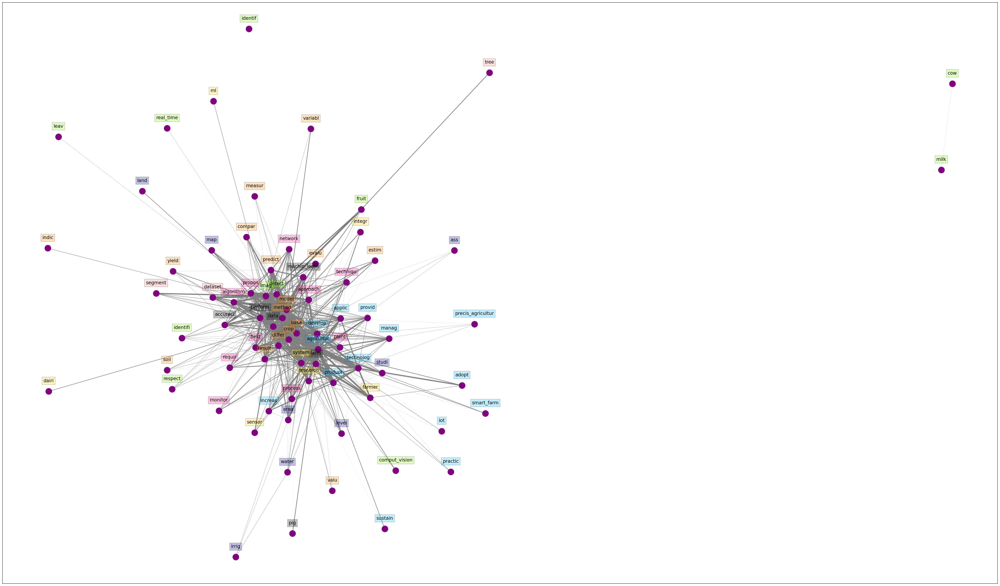

In [94]:
inst = CooccEmbedding(bigrams)
new_vocab_inst = inst.set_vocab(LDA_words)
cooc_matrix = inst.cooc_matrix()
indexes = n_highest_indices(cooc_matrix,600)
dict_highest_pair = inst.dict_pair(indexes)
plot_network_cooc(dict_highest_pair, word_to_topic)

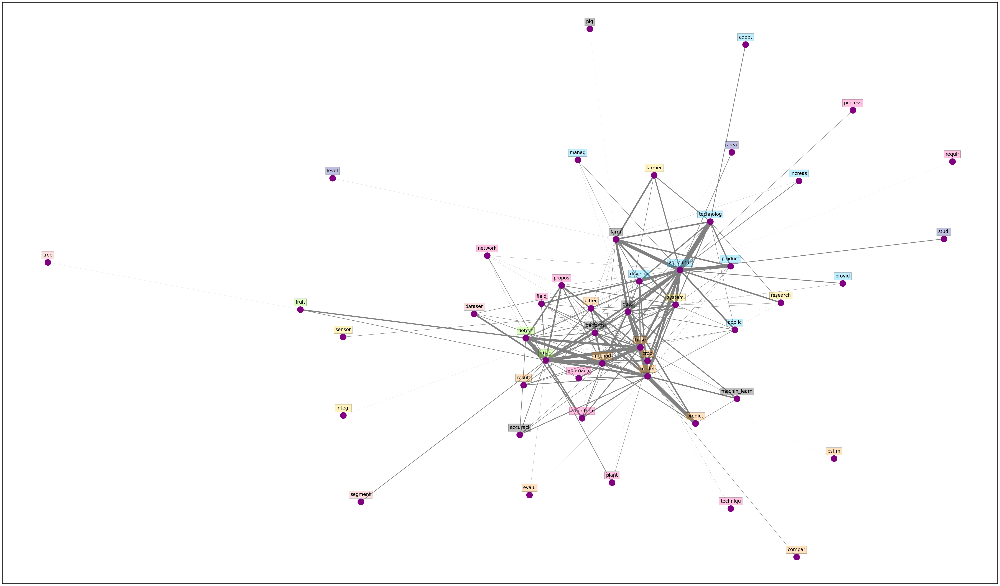

In [95]:
inst = CooccEmbedding(bigrams)
new_vocab_inst = inst.set_vocab(LDA_words)
cooc_matrix = inst.cooc_matrix()
indexes = n_highest_indices(cooc_matrix,200)
dict_highest_pair = inst.dict_pair(indexes)
plot_network_cooc(dict_highest_pair, word_to_topic)

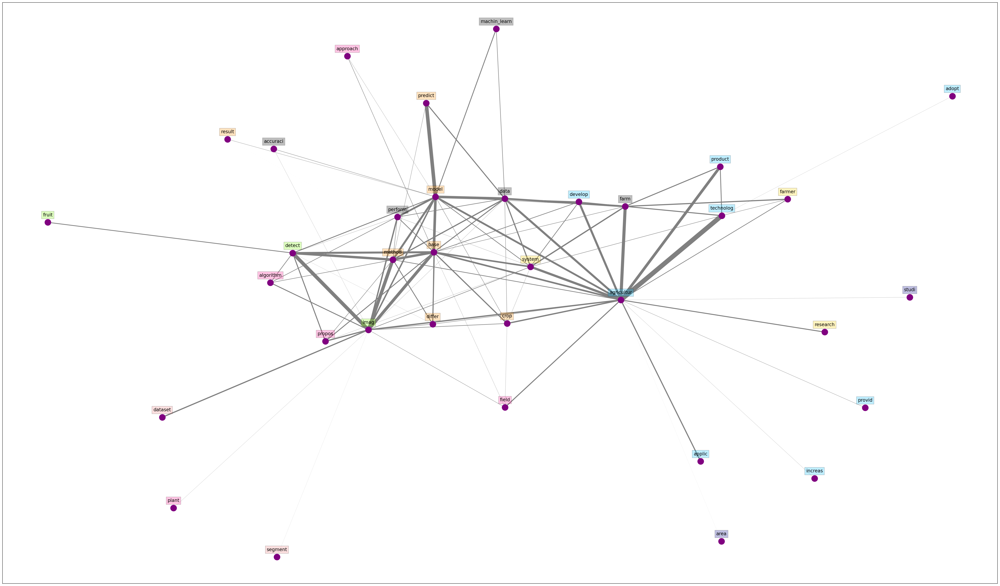

In [96]:
inst = CooccEmbedding(bigrams)
new_vocab_inst = inst.set_vocab(LDA_words)
cooc_matrix = inst.cooc_matrix()
indexes = n_highest_indices(cooc_matrix,100)
dict_highest_pair = inst.dict_pair(indexes)
plot_network_cooc(dict_highest_pair, word_to_topic)

### Representation per Topic

In [97]:
LDA_words = []
word_to_topic = {}
counter = 0

for topic in ldamodel.show_topics(num_topics=num_topics, num_words=num_words, log=False, formatted=False):
    
    topic_list = list(topic)[1]
    for word in topic_list:
        if word[0] not in LDA_words: 
            LDA_words.append(word[0])
            word_to_topic[word[0]]=counter
    counter+=1

TOPIC pig: 0


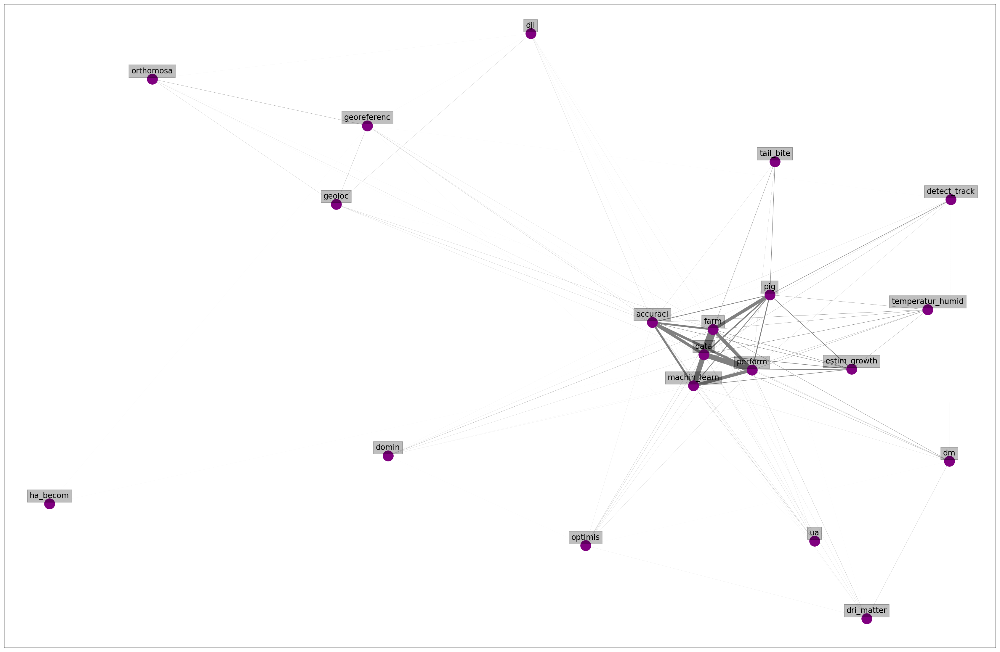

TOPIC move: 1


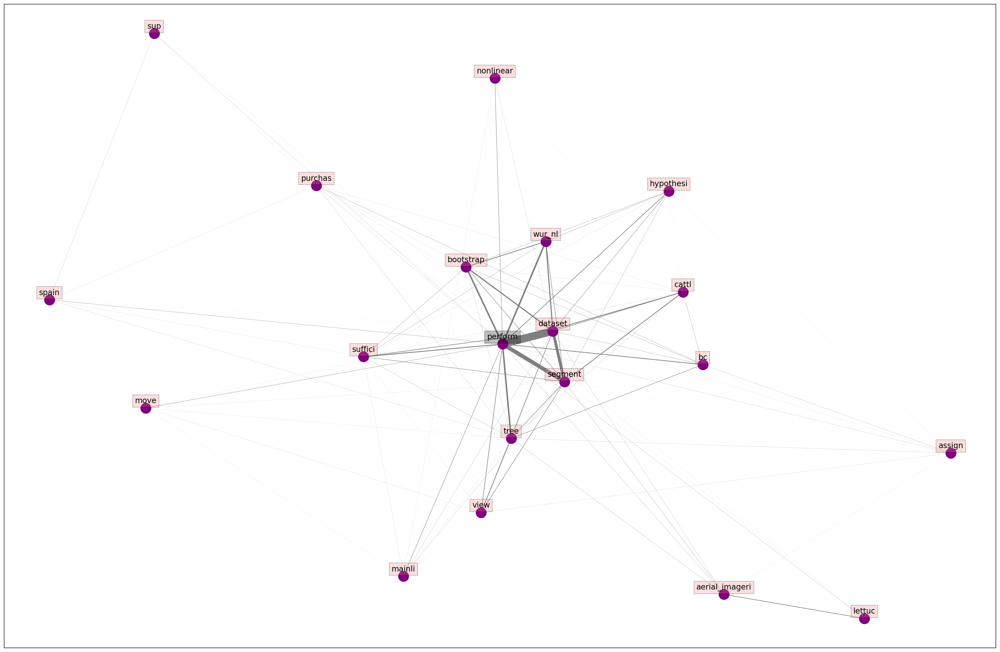

TOPIC trait: 2


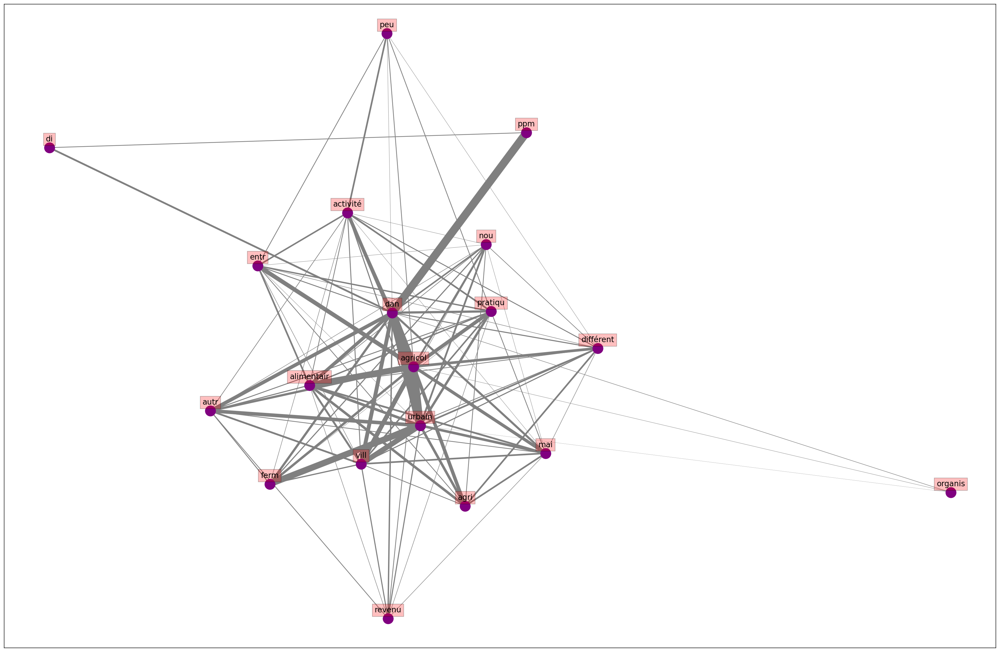

TOPIC model: 3


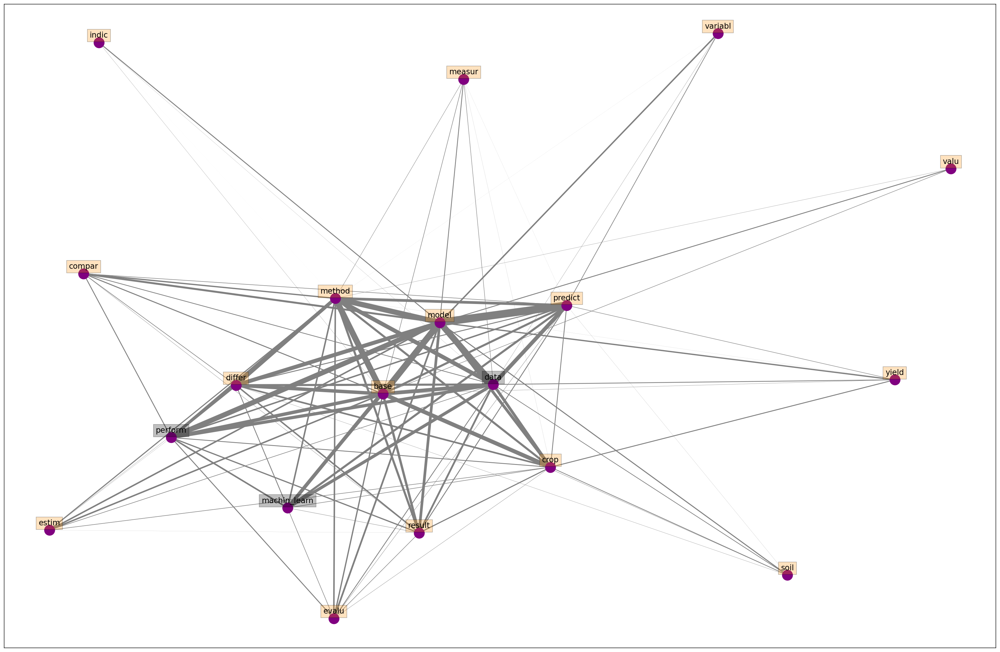

TOPIC data: 4


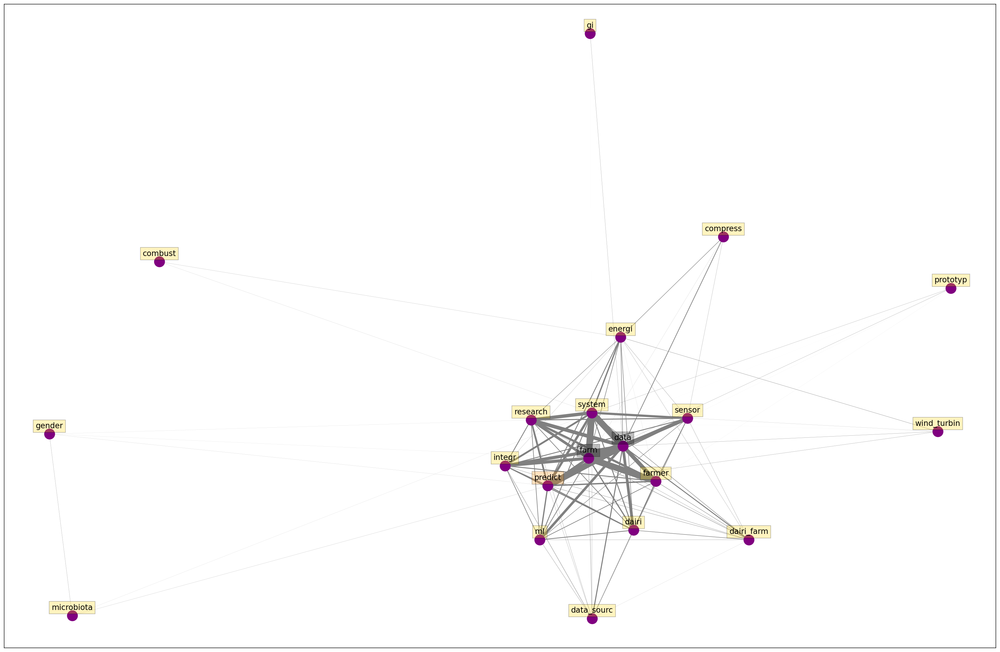

TOPIC detect: 5


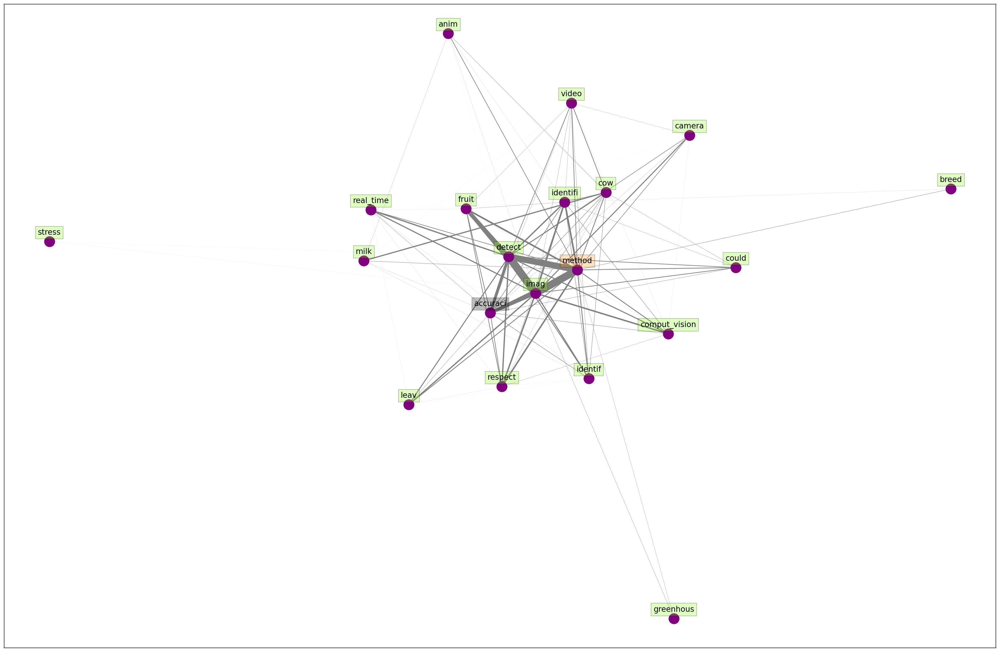

TOPIC item: 6


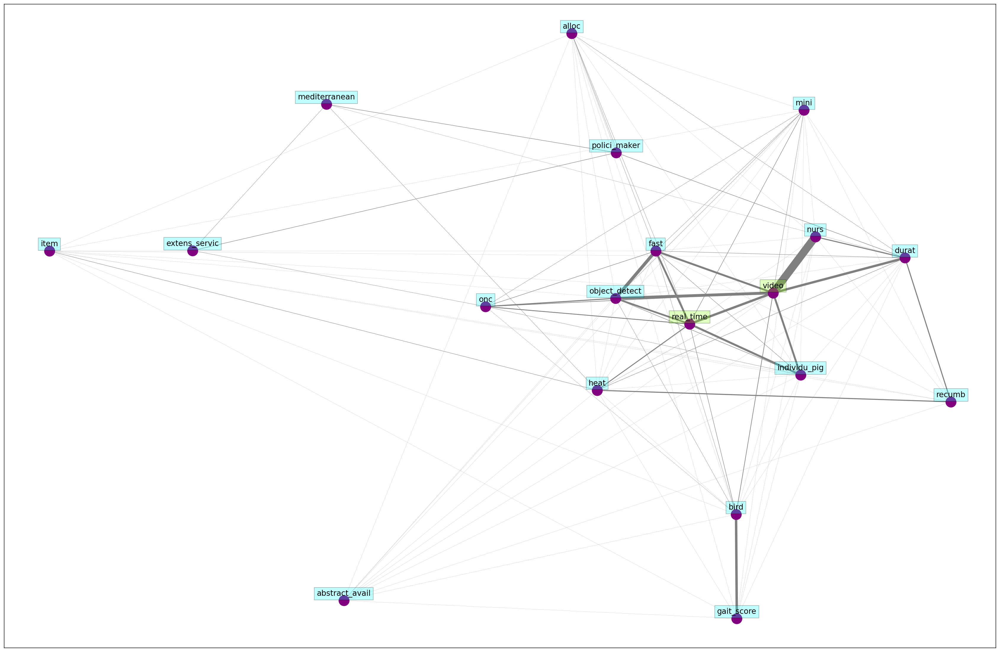

TOPIC agricultur: 7


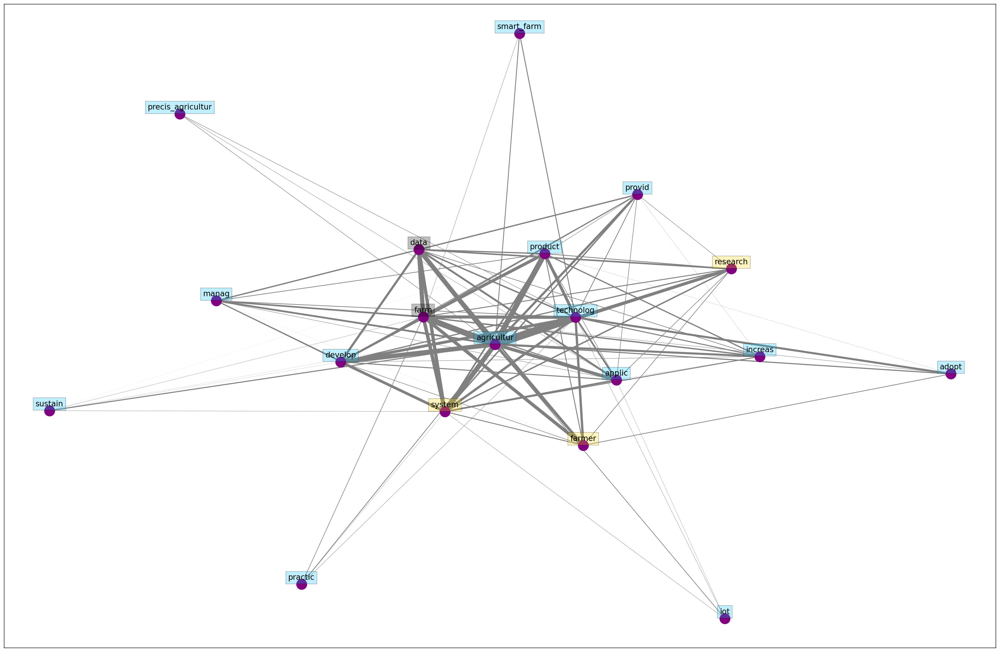

TOPIC area: 8


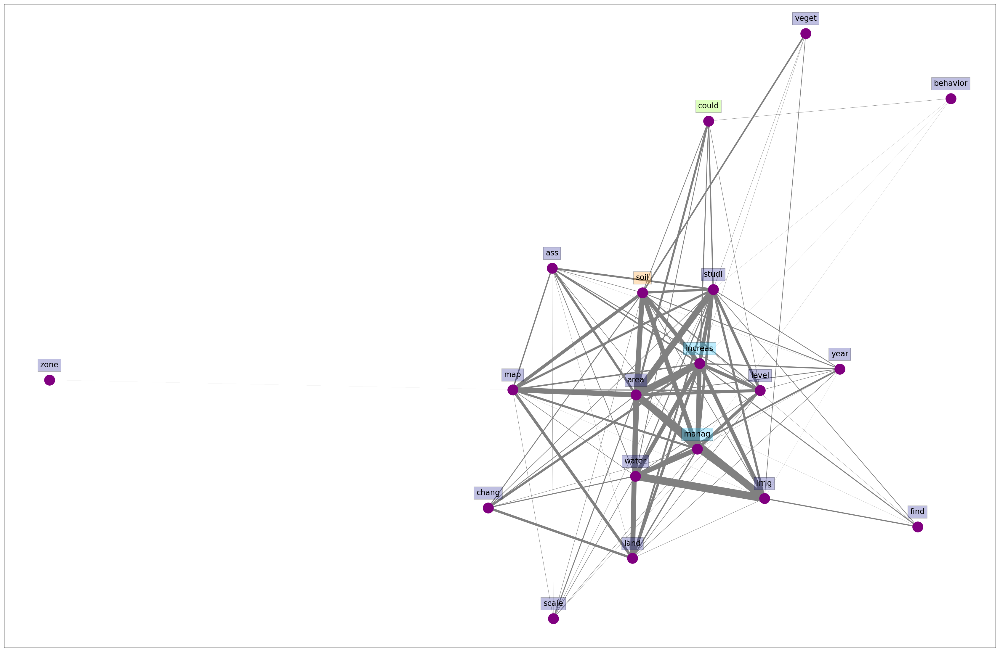

TOPIC base: 9


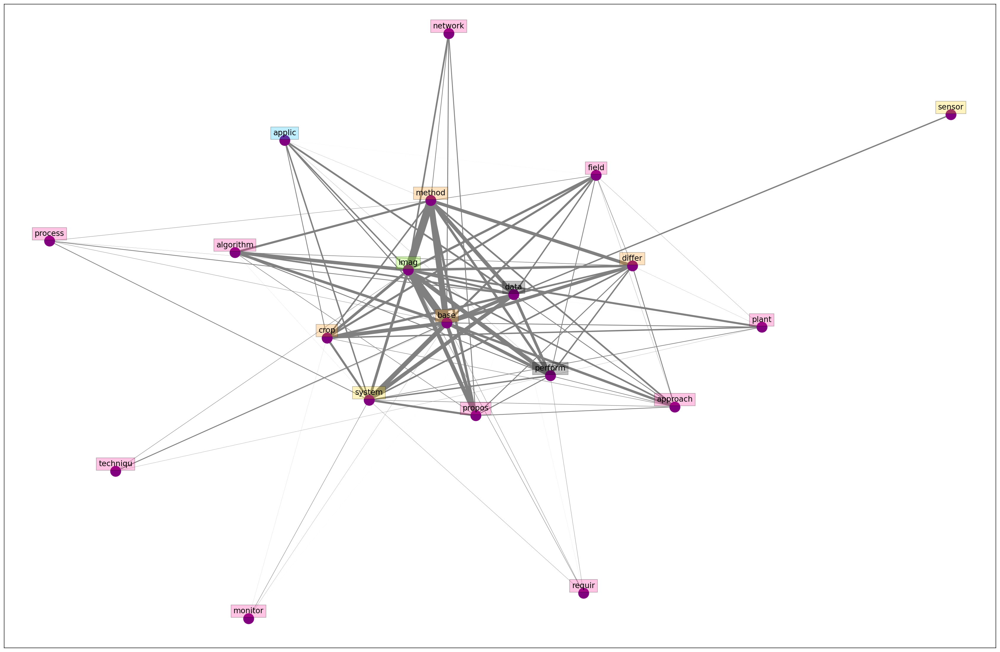

In [101]:
topics = []
for topic in ldamodel.show_topics(num_topics=num_topics, num_words=num_words, log=False, formatted=False):
    topic_list = list(topic)[1]
    words = [el[0] for el in topic_list]
    topics.append(words)

### Graph per topic
inst = CooccEmbedding(bigrams)

for k in range(len(topics)):
    new_vocab_inst = inst.set_vocab(topics[k])
    cooc_matrix = inst.cooc_matrix()
    indexes = n_highest_indices(cooc_matrix,100)
    dict_highest_pair = inst.dict_pair(indexes)
    
    print("TOPIC {}: {}".format(topics[k][0],k))
    plot_network_cooc(dict_highest_pair, word_to_topic,figsize=(30,20))

### SVD representation with LDA word

In [122]:
inst = CooccEmbedding(bigrams)
vocab_inst = inst.vocabulary()
# new_vocab_inst = inst.set_vocab(list(top_words.feature))
cooc_matrix = inst.cooc_matrix()
len(vocab_inst)

14673

Compute SVD matrix

In [123]:
%%time
svd_matrix = inst.svd_reduction()

CPU times: user 1min 18s, sys: 19.3 s, total: 1min 37s
Wall time: 1min 6s


In [127]:
svd_matrix = svd_matrix/100

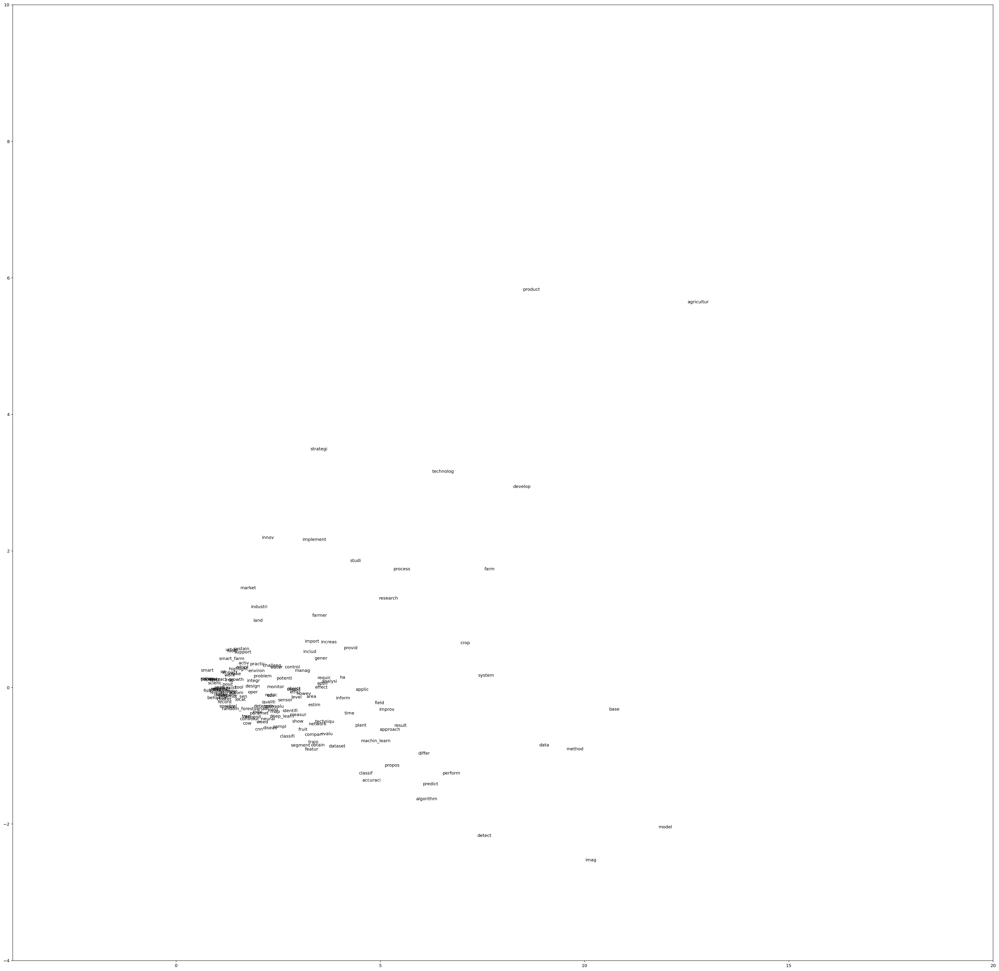

In [128]:
f = plt.figure(figsize=(40,40))
plt.xlim(-4, 20)
plt.ylim(-4, 10)
dict_to_plot = inst.vocab_ind_to_plot(LDA_words)

for word, ind in dict_to_plot.items():
    plt.text(svd_matrix[ind, 0], svd_matrix[ind, 1], vocab_inst[ind],color=word_to_topic)

## Getting texts representing the topics

In [ ]:
def format_topics_sentences(ldamodel, corpus, texts = bigrams):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)


In [67]:
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

    
Document_No = list(sent_topics_sorteddf_mallet.index)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

#keep Document_No
sent_topics_sorteddf_mallet["Document_No"] = Document_No

# Show
sent_topics_sorteddf_mallet.head(40)

,Topic_Num,Topic_Perc_Contrib,Keywords,Text,Document_No
0,0.0,0.8543,"product, agricultur, develop, technolog, proce...","[actual, import, research, theme, combat, hung...",1347
1,1.0,0.7822,"practic, studi, function, soil, level, health,...","[одной, из, основных, тенденций, изменения, су...",1525
2,2.0,0.6620,"data, applic, agricultur, technolog, farm, man...","[machinelearn, ml, offer, newapproach, analyz,...",1628
3,3.0,0.8073,"dan, yang, dengan, one_hundr, °c, twenti, pada...","[pengembangan, pangan, fungsion, berbasi, baha...",1107
4,4.0,0.6326,"agricultur, farm, farmer, technolog, adopt, ur...","[agricultur_sector, nigeria, character, low, p...",1191
5,5.0,0.6141,"plant, improv, perform, design, gener, researc...","[keyword_comput, vision, semant_segment, synth...",1463
6,6.0,0.5789,"system, farm, pig, monitor, base, measur, anim...","[behavior, livestock_farm, primari, repres, an...",2005
7,7.0,0.5330,"water, irrig, increas, paramet, valu, manag, l...","[oil_palm, industri, vital, malaysian, economi...",119
8,8.0,0.6236,"detect, imag, method, algorithm, fruit, segmen...","[acquisit, qualiti, inform, plug_seedl, founda...",438
9,9.0,0.5090,"model, predict, machin_learn, variabl, algorit...","[wind_power, variabl, gener, resourc, therefor...",1746


In [72]:
for i in range (24):
    print("\n")
    print(sent_topics_sorteddf_mallet["Keywords"][i])
    print(mix[sent_topics_sorteddf_mallet["Document_No"][i]])



product, agricultur, develop, technolog, process, industri, energi, system, strategi, research
Actual importance of research theme: Combating hunger and providing the Earth’s population with sufficient amount of products is considered one of the strategic priorities of human civilization sustainable development by the UN up to 2030. The rapid growth of this planet’s human population in the 21st century, estimated at 7.6. billion people, leads to the global demand for production and foodstuff. Simultaneously, traditional strategies of extensive development conventional in the 20th century and “target” intensification of agriculture do not take expected positive effect nowadays. World economy requires for new strategies of agricultural production, as well as promoting ‘green revolution’ based on the ground of IT technology advances and “Industry 4.0.”. The generalization of world experience concerning development and implementing agricultural production strategies in the 21st century i

KeyError: 18